In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import plotly.express as px

In [2]:
raw_pv_data = context.catalog.load('pv_data_raw')

2022-08-26 17:58:34,365 - kedro.io.data_catalog - INFO - Loading data from 'pv_data_raw' (CSVDataSet)...


In [3]:
raw_pv_data.head()

,date,time,generation (w),temperature (˚C),Unnamed: 4
0,1/1/19,12:05:00 AM,0.0,10.1,NaN
1,1/1/19,12:10:00 AM,0.0,10.1,NaN
2,1/1/19,12:15:00 AM,0.0,10.1,NaN
3,1/1/19,12:20:00 AM,0.0,10.0,NaN
4,1/1/19,12:25:00 AM,0.0,10.0,NaN


In [4]:
raw_pv_data.describe()

,generation (w),temperature (˚C),Unnamed: 4
count,105120.000000,105120.000000,0.0
mean,660.249848,16.973055,NaN
std,1158.942285,4.901843,NaN
min,0.000000,0.000000,NaN
25%,0.000000,13.700000,NaN
50%,32.000000,16.900000,NaN
75%,810.000000,20.300000,NaN
max,6056.000000,32.300000,NaN


In [5]:
raw_pv_data.drop(columns='Unnamed: 4', inplace=True)

In [6]:
raw_pv_data = raw_pv_data[~raw_pv_data.isna().any(axis=1)]

In [7]:
raw_pv_data['datetime'] = raw_pv_data['date'].astype(str) + ' ' + raw_pv_data['time'].astype(str)

In [8]:
raw_pv_data['datetime'] = pd.to_datetime(raw_pv_data['datetime'], format='%m/%d/%y %I:%M:%S %p')
raw_pv_data.drop(columns=['date', 'time'], inplace=True)

In [9]:
raw_pv_data.head()

,generation (w),temperature (˚C),datetime
0,0.0,10.1,2019-01-01 00:05:00
1,0.0,10.1,2019-01-01 00:10:00
2,0.0,10.1,2019-01-01 00:15:00
3,0.0,10.0,2019-01-01 00:20:00
4,0.0,10.0,2019-01-01 00:25:00


In [10]:
raw_pv_data[raw_pv_data.duplicated(subset='datetime', keep=False)]

,generation (w),temperature (˚C),datetime


In [11]:
raw_pv_data.index = raw_pv_data['datetime']
raw_pv_data.drop(columns='datetime', inplace=True)

In [12]:
from adtk.detector import SeasonalAD
sad = SeasonalAD()
raw_pv_data['ad'] = sad.fit_detect(raw_pv_data['generation (w)'])

In [13]:
raw_pv_data.head()

,generation (w),temperature (˚C),ad
datetime,,,
2019-01-01 00:05:00,0.0,10.1,False
2019-01-01 00:10:00,0.0,10.1,False
2019-01-01 00:15:00,0.0,10.1,False
2019-01-01 00:20:00,0.0,10.0,False
2019-01-01 00:25:00,0.0,10.0,False


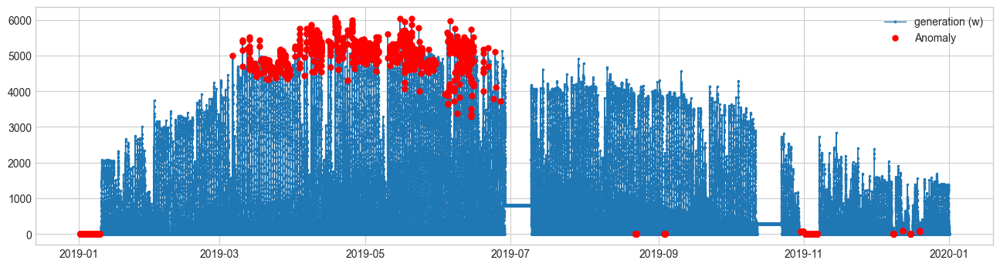

In [14]:
from adtk.visualization import plot
plot(raw_pv_data['generation (w)'], anomaly=raw_pv_data['ad'], ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");

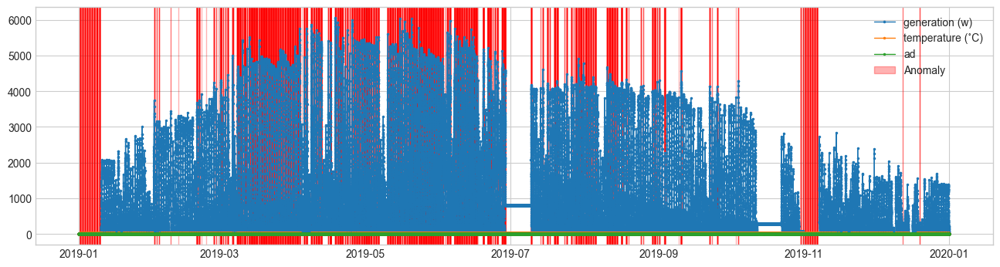

In [15]:
from adtk.detector import RegressionAD
from sklearn.linear_model import LinearRegression
regression_ad = RegressionAD(regressor=LinearRegression(), target="generation (w)", c=3.0)
anomalies = regression_ad.fit_detect(raw_pv_data)
plot(raw_pv_data, anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_color='red', anomaly_alpha=0.3, curve_group='all');

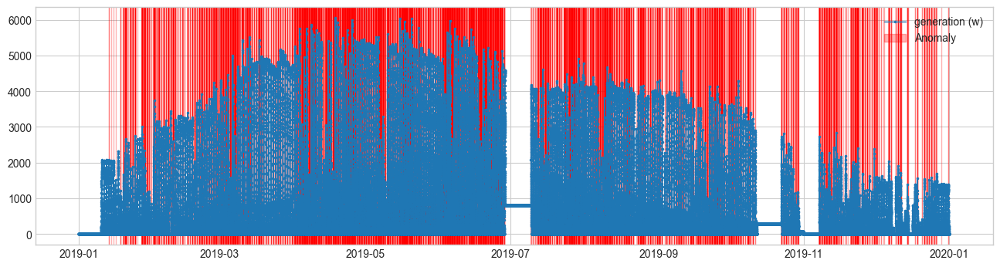

In [16]:
from adtk.detector import PersistAD
persist_ad = PersistAD(c=3.0, side='positive')
anomalies = persist_ad.fit_detect(raw_pv_data['generation (w)'])
plot(raw_pv_data['generation (w)'], anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_color='red');

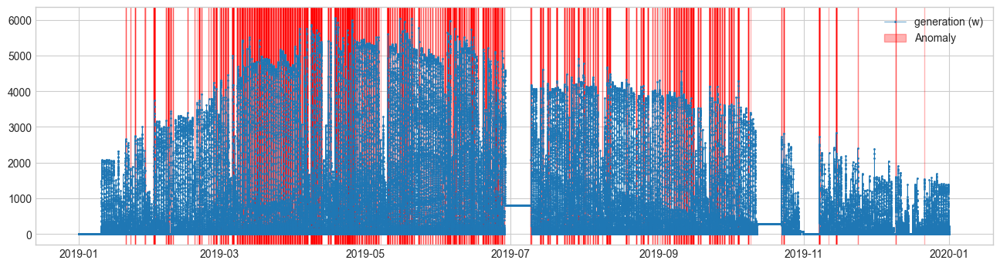

In [17]:
from adtk.detector import LevelShiftAD
level_shift_ad = LevelShiftAD(c=6.0, side='both', window=5)
anomalies = level_shift_ad.fit_detect(raw_pv_data['generation (w)'])
plot(raw_pv_data['generation (w)'], anomaly=anomalies, anomaly_color='red');

In [31]:
raw_pv_data['failures'] = raw_pv_data['generation (w)'].diff(-1).map(lambda x: 1 if abs(x) <= 0.01*7500 else 0 )

In [33]:
raw_pv_data.head()

,generation (w),temperature (˚C),ad,failures
datetime,,,,
2019-01-01 00:05:00,0.0,10.1,False,1
2019-01-01 00:10:00,0.0,10.1,False,1
2019-01-01 00:15:00,0.0,10.1,False,1
2019-01-01 00:20:00,0.0,10.0,False,1
2019-01-01 00:25:00,0.0,10.0,False,1


In [35]:
px.line(raw_pv_data,  y =['generation (w)'])

2022-08-26 18:04:54,607 - py.warnings - WARNING - /Users/sharabhshukla/Documents/tutorials/solar_fcsting_competition/solar-fcst/venv/lib/python3.8/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.




In [37]:
px.line(raw_pv_data, y=['failures'])

2022-08-26 18:05:14,378 - py.warnings - WARNING - /Users/sharabhshukla/Documents/tutorials/solar_fcsting_competition/solar-fcst/venv/lib/python3.8/site-packages/plotly/io/_renderers.py:395: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.


